# Generate Areas of Interest and Tessellation 

In this step, we generate the **areas of interest** (AOIs) and tessellation layers for this pilot study. The source data is available upon request on the [project's folder](https://worldbankgroup.sharepoint.com/:f:/r/teams/DevelopmentDataPartnershipCommunity-WBGroup/Shared%20Documents/Projects/Syria%20Economic%20Monitor?csf=1&web=1&e=C7rRtc) and is classified as "Official Use Only".

In [1]:
import contextily as cx
import geopandas
import h3
import matplotlib.pyplot as plt
import pandas as pd
import shapely
from polycircles import polycircles
from shapely.geometry import Polygon

In [2]:
# Parameters
# https://papermill.readthedocs.io/en/latest/usage-parameterize.html

RADIUS = 2000  # meters
RES = 10

## Areas of Interest

In this step, as described in the [methodological notes](README.md), we generate [Region A](#region-a) and [Region B](#region-a). The regions are defined as areas around points of interest, e.g. border checkpoints.

In [3]:
# Below, see auxiliary functions. Ideally, we'd move them to a package in the future

def get_circles(row, radius=RADIUS):
    polycircle = polycircles.Polycircle(
        latitude=row["latitude"],
        longitude=row["longitude"],
        radius=radius,
    )
    return shapely.wkt.loads(polycircle.to_wkt())

def get_h3_tessellation(
    gdf: geopandas.GeoDataFrame, name="shapeName", resolution=RES
):
    mapper = dict()
    h3_tessellation = set()

    # TODO: vectorize, if possible
    for idx, row in gdf.iterrows():
        geometry = row["geometry"]

        match geometry.geom_type:
            case "Polygon":
                hex_ids = h3.polyfill(
                    shapely.geometry.mapping(geometry), resolution, geo_json_conformant=True
                )

                h3_tessellation = h3_tessellation.union(set(hex_ids))
                mapper.update([(hex_id, row[name]) for hex_id in hex_ids])

            case "MultiPolygon":
                for x in geometry.geoms:
                    hex_ids = h3.polyfill(
                        shapely.geometry.mapping(x), resolution, geo_json_conformant=True
                    )

                    h3_tessellation = h3_tessellation.union(set(hex_ids))
                    mapper.update([(hex_id, row[name]) for hex_id in hex_ids])
            case _:
                raise (Exception)

    return mapper, h3_tessellation

### Region A

First, we define **Region A** as the region within `RADIUS` (meters) of `CHECKPOINTS`. 

In [4]:
CHECKPOINTS = pd.read_csv("../../data/external/border_crossings_jordan.csv")

In [5]:
CHECKPOINTS = geopandas.GeoDataFrame(
    CHECKPOINTS,
    geometry=geopandas.points_from_xy(
        CHECKPOINTS.longitude, CHECKPOINTS.latitude, crs="EPSG:4326"
    ),
)

CHECKPOINTS

,id,name,latitude,longitude,geometry
0,1,Jdeidet Yabbous (Al- Masnaa),33.674157,35.964726,POINT (35.96473 33.67416)
1,2,Tartous (Al-Arida),34.634027,35.976433,POINT (35.97643 34.63403)
2,3,Al-Dabbousieh (Al- Abboudiyeh),34.638938,36.119218,POINT (36.11922 34.63894)
3,4,Tel Kalakh (Al-Buqayaa),34.668012,36.303241,POINT (36.30324 34.66801)
4,5,Joussieh (Al-Qaa),34.421778,36.543310,POINT (36.54331 34.42178)
5,6,Matraba,34.663613,36.349282,POINT (36.34928 34.66361)


In [6]:
CHECKPOINTS.explore()

#### Create circles centered at `CHECKPOINTS` 

Further in this analysis, we will identify unique devices detected in the proximity of the points of interest (e.g., border checkpoints). Thus, we create areas of interest centered at the checkpoints, using the auxiliary `get_circles` function below, which creates circles of `RADIUS` centered at the coordinates.

In [7]:
# proj EPSG:32634
CHECKPOINTS["geometry"] = CHECKPOINTS.to_crs("EPSG:32634").apply(
    get_circles, axis=1
)  # meters

# proj lat/lon
CHECKPOINTS = CHECKPOINTS.to_crs("EPSG:4326")

#### Region A: Generate Tessellation (H3)

As for the tessellation, we use [H3 resolution 10](https://h3geo.org/docs/core-library/restable/) toTo expediate the computation of spatial joins.

In [8]:
_, HEXID_A = get_h3_tessellation(CHECKPOINTS, name="name")

Let's visualize and inspect now,

In [9]:
geometry = [Polygon(h3.h3_to_geo_boundary(idx, True)) for idx in HEXID_A]
A = geopandas.GeoDataFrame(
    HEXID_A, geometry=geometry, columns=["hex_id"], crs="EPSG:4326"
)

In [10]:
A.explore()

In [11]:
# A.to_file("../../data/interim/rois/id=7&name=A.geojson", driver="GeoJSON")

### Region B

In this step, we generate **Region B** defined as a border buffer strip between Lebanon and Syria, using boudaries provided by [geoBoundaries](https://www.geoboundaries.org).

In [12]:
LBN = geopandas.read_file(
    "../../data/external/geoBoundaries/geoBoundaries-LBN-ADM0-all/geoBoundaries-LBN-ADM0_simplified.shp"
)
SYR = geopandas.read_file(
    "../../data/external/geoBoundaries/geoBoundaries-SYR-ADM0-all/geoBoundaries-SYR-ADM0_simplified.shp"
)

Now, we create a boundary buffer.

In [13]:
# convert to meters
LBN = LBN.to_crs("EPSG:32634")
SYR = SYR.to_crs("EPSG:32634")

# create a 500m buffer
LBN = geopandas.GeoDataFrame(LBN, geometry=LBN.boundary.buffer(250))
SYR = geopandas.GeoDataFrame(SYR, geometry=SYR.boundary.buffer(250))

BORDER = geopandas.overlay(SYR, LBN).to_crs("EPSG:4326")

In [14]:
BORDER.explore()

#### Region B: Generate Tessellation (H3)

In [15]:
_, HEXID_BORDER = get_h3_tessellation(BORDER, name="shapeName_1")

Next, we remove the difference, 

In [16]:
HEXID_B = HEXID_BORDER.difference(HEXID_A)

In [17]:
geometry = [Polygon(h3.h3_to_geo_boundary(idx, True)) for idx in HEXID_B]
B = geopandas.GeoDataFrame(
    pd.DataFrame(HEXID_B, columns=["hex_id"]), geometry=geometry, crs="EPSG:4326"
)

In [18]:
B.explore()

In [19]:
# B.to_file("../../data/interim/rois/id-8&name=B.geojson", driver="GeoJSON")

### Regions A & B

Finally, see visualize below **Region A** (blue) and **Region B** (red).

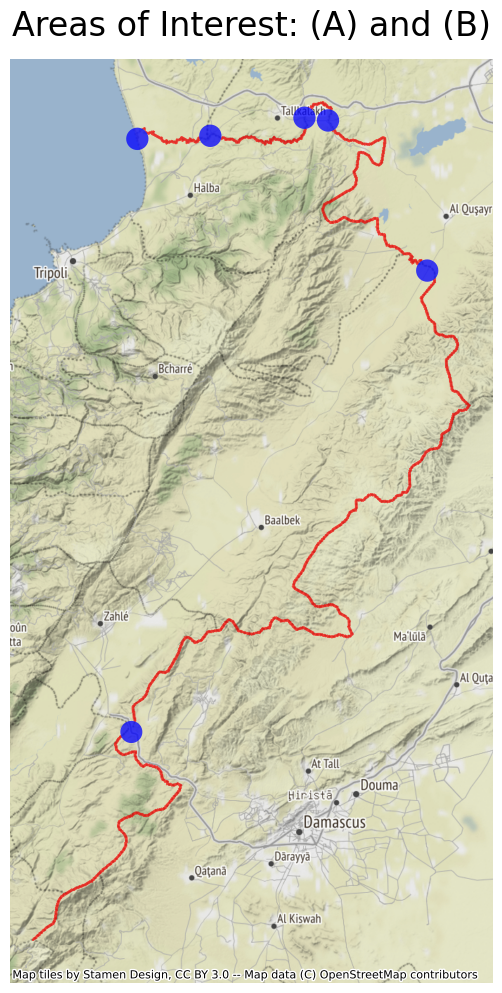

In [20]:
fig, ax = plt.subplots(figsize=(8, 12))

B.to_crs(epsg=3857).plot(ax=ax, color="red")
CHECKPOINTS.to_crs(epsg=3857).plot(ax=ax, alpha=0.75, color="blue")

ax.set_title("Areas of Interest: (A) and (B)", fontsize=24)
ax.axis("off")

cx.add_basemap(ax)

In [21]:
# fig.savefig("../../reports/rois.png", dpi=300, transparent=True, bbox_inches="tight")

## Tessellation

In this step, we generate tessellation layers using the [H3](https://h3geo.org) hexagonal hierarchical geospatial indexing system.

### LB-SY Tessellation

In [22]:
LBN = geopandas.read_file(
    "../../data/external/geoBoundaries/geoBoundaries-LBN-ADM1-all/geoBoundaries-LBN-ADM1_simplified.shp"
)
SYR = geopandas.read_file(
    "../../data/external/geoBoundaries/geoBoundaries-SYR-ADM1-all/geoBoundaries-SYR-ADM1_simplified.shp"
)

In [23]:
AOI = pd.concat([LBN, SYR], ignore_index=True)

Exploding `MultiPolygon` to `Polygon`

In [24]:
AOI = AOI.explode()

/var/folders/9h/d730wcc12x58ffvkft3gs4sr0000gn/T/ipykernel_45102/3456624557.py:1: FutureWarning: Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.
  AOI = AOI.explode()


Removing irrelevant (non-convex) regions

In [25]:
a = AOI[AOI.index.isin([(1, 4)])]
b = AOI[AOI.index.isin([(15, 1)])]

AOI = AOI[AOI["shapeISO"] != "LB-AS"]
AOI = AOI[AOI["shapeISO"] != "SYR-TA"]

AOI = pd.concat([AOI, a, b])

In [26]:
AOI.explore()

Preparing tessellation for further steps and saving.

In [27]:
AOI["tile_ID"] = AOI["shapeISO"]

AOI.to_file("../../data/interim/tessellation/LNBSYR.geojson", driver="GeoJSON")

### LB-SY Tessellation (H3)

In [28]:
mapper, HEXID_SY = get_h3_tessellation(AOI, name="shapeISO", resolution=5)

In [29]:
TESSELLATION = geopandas.GeoDataFrame(
    data=HEXID_SY,
    geometry=[Polygon(h3.h3_to_geo_boundary(idx, True)) for idx in HEXID_SY],
    columns=["tile_ID"],
    crs="EPSG:4326",
)

Plotting with [matplotlib](https://matplotlib.org/),

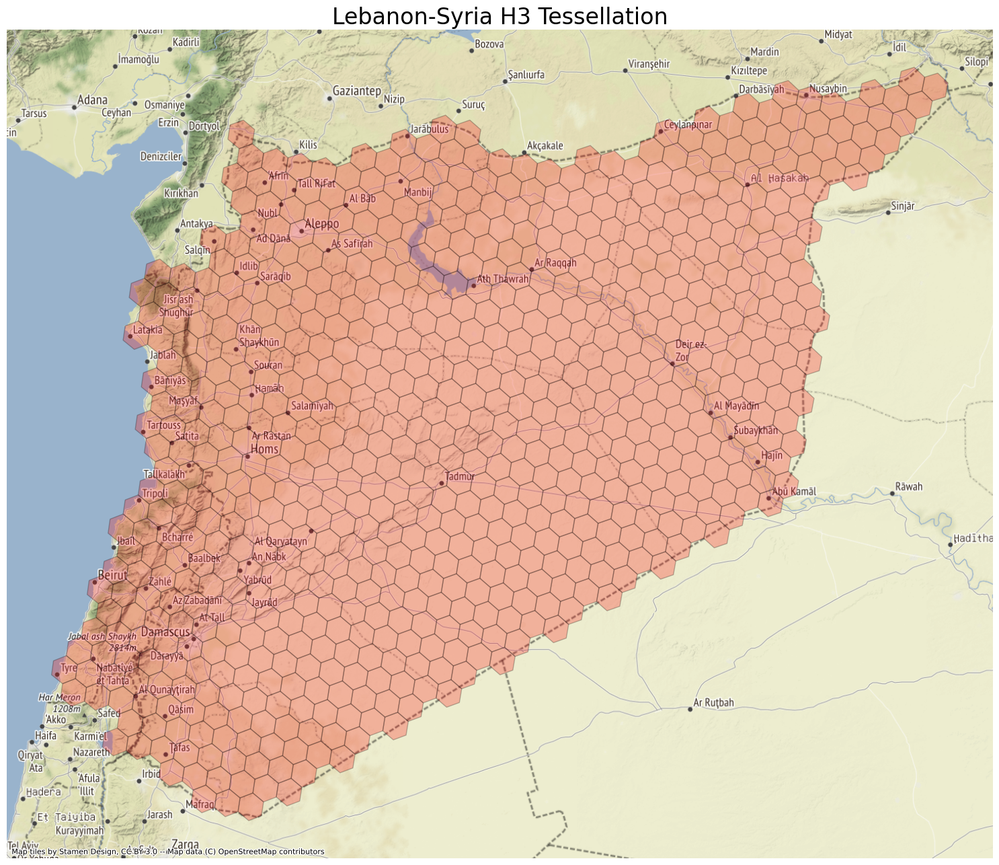

In [30]:
fig, ax = plt.subplots(figsize=(20, 16))

TESSELLATION.to_crs(epsg=3857).plot(ax=ax, alpha=0.25, color="red", edgecolor="k")

ax.axis("off")
ax.set_title(f"Lebanon-Syria H3 Tessellation", fontsize=24)

cx.add_basemap(ax)

In [31]:
fig.savefig("../../reports/LBNSYR.png", dpi=300, transparent=True, bbox_inches="tight")

In [32]:
TESSELLATION.to_file("../../data/interim/tessellation/LNBSYRH3.geojson", driver="GeoJSON")

In [33]:
TESSELLATION["coordinates"] = TESSELLATION["tile_ID"].apply(h3.h3_to_geo)
TESSELLATION[["lat", "lon"]] = pd.DataFrame(TESSELLATION["coordinates"].tolist(), columns=["lat", "lon"])
TESSELLATION["id"] = TESSELLATION["tile_ID"]
TESSELLATION["name"] = TESSELLATION["tile_ID"]
TESSELLATION[["id", "name", "lat", "lon"]].to_csv("../../data/final/locations.csv", index=False)